In [38]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import h5py
import scipy.sparse as sp
import yaml
import scanpy as sc
import scanpy.external as sce
import gget
import time

import logging

# Load data

In [2]:
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/hsc_epi2me/anndata/hsc_data.h5ad"
adata = sc.read_h5ad(fpath)
sc.logging.print_memory_usage()
adata

Memory usage: current 0.97 GB, difference +0.97 GB


AnnData object with n_obs × n_vars = 12033 × 25526
    obs: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2'
    var: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2'

In [3]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

adata

AnnData object with n_obs × n_vars = 12033 × 25526
    obs: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

# Filtering

In [4]:
sc.pp.filter_cells(adata, min_counts=200)
sc.pp.filter_genes(adata, min_counts=10)

adata.layers['counts'] = adata.X.copy()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

adata.layers['log_norm'] = adata.X.copy()
adata

AnnData object with n_obs × n_vars = 8541 × 22247
    obs: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts'
    var: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts'
    uns: 'log1p'
    layers: 'counts', 'log_norm'

# Plotting

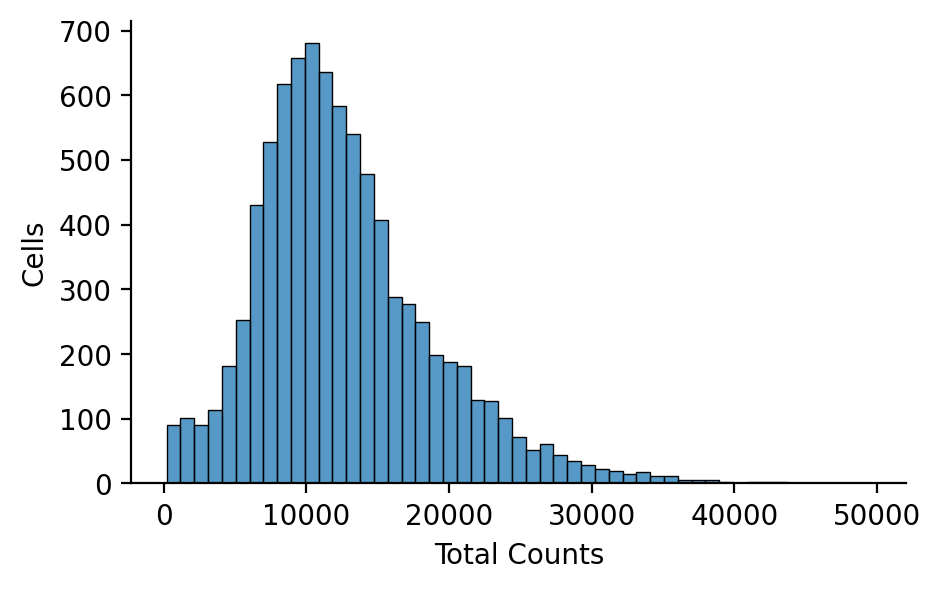

In [5]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 3

sns.histplot(
    data=adata.obs,
    x='total_counts',
    bins=51,
)

plt.ylabel('Cells')
plt.xlabel('Total Counts')
sns.despine()

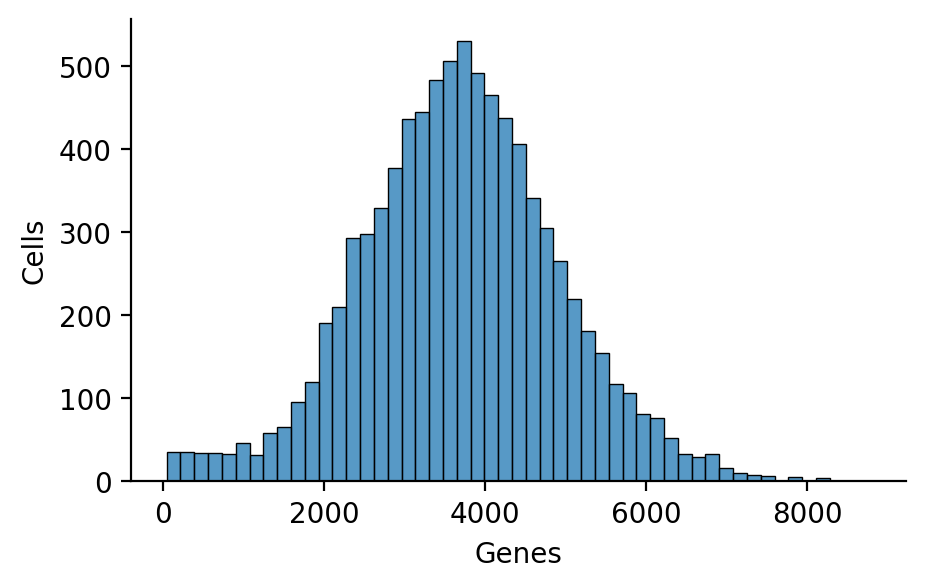

In [6]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 3

sns.histplot(
    data=adata.obs,
    x='n_genes_by_counts',
    bins=51,
)

plt.ylabel('Cells')
plt.xlabel('Genes')
sns.despine()

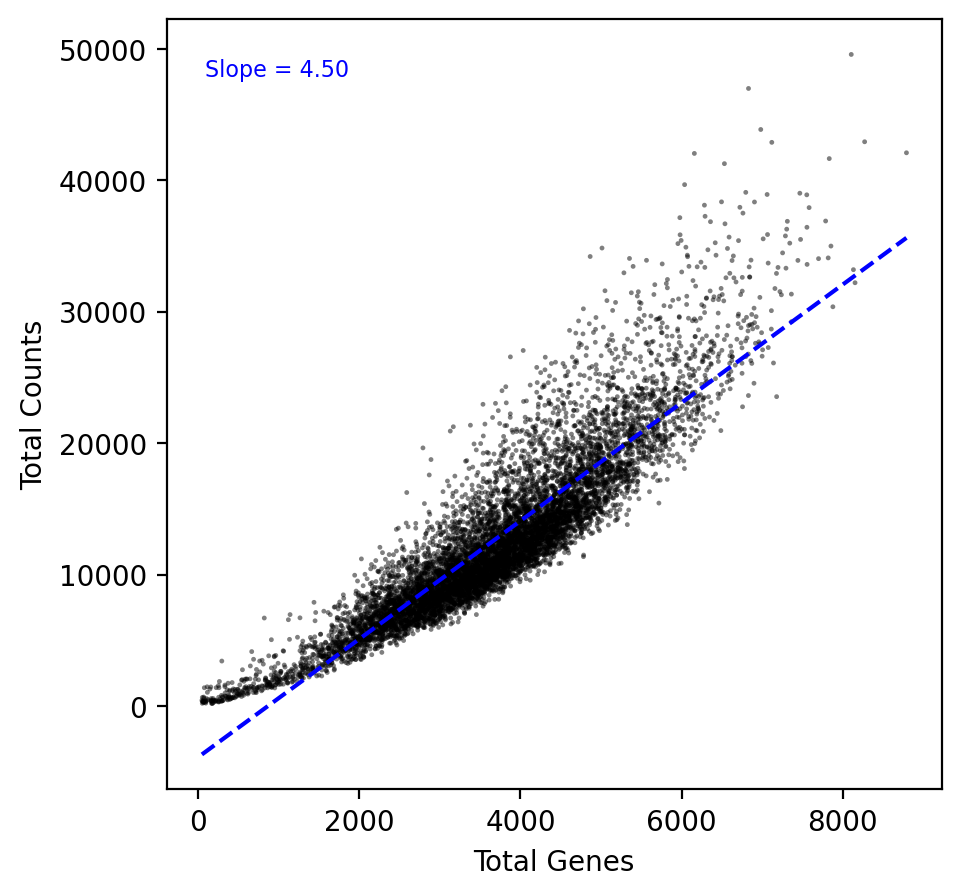

In [7]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 5

# Extract x and y
x = adata.obs['n_genes_by_counts']
y = adata.obs['total_counts']

# Scatterplot
sns.scatterplot(
    x=x,
    y=y,
    ec='none',
    s=3,
    alpha=0.5,
    c='k',
)

# Fit a regression line
slope, intercept = np.polyfit(x, y, 1)
x_vals = np.array([x.min(), x.max()])
y_vals = intercept + slope * x_vals

# Plot regression line
plt.plot(x_vals, y_vals, color='b', linewidth=1.5, ls="--")

# Annotate slope
plt.text(
    0.05, 0.95,
    f'Slope = {slope:.2f}',
    transform=plt.gca().transAxes,
    ha='left',
    va='top',
    color='b',
    fontsize=8,
)

# Labels
plt.ylabel('Total Counts')
plt.xlabel('Total Genes')

# Show plot
plt.show()

# Feature Selection

Number of genes before HVG selection: 22247
Number of HVGs: 3233


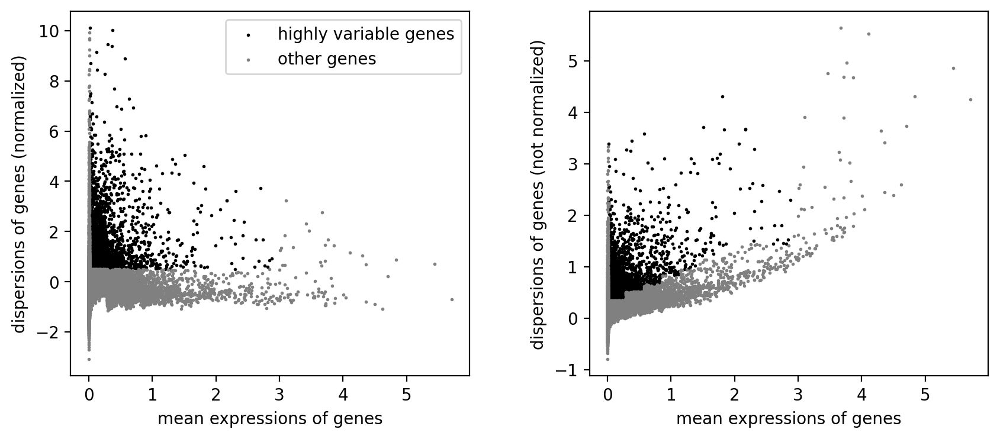

AnnData object with n_obs × n_vars = 8541 × 22247
    obs: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts'
    var: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts', 'log_norm'

In [8]:
adata.raw = adata  # keep full dimension safe
print(f"Number of genes before HVG selection: {adata.n_vars}")

sc.pp.highly_variable_genes(
    adata, 
)

print(f"Number of HVGs: {adata.var['highly_variable'].sum()}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 4
sc.pl.highly_variable_genes(
    adata
)

adata

# PCA and Clustering

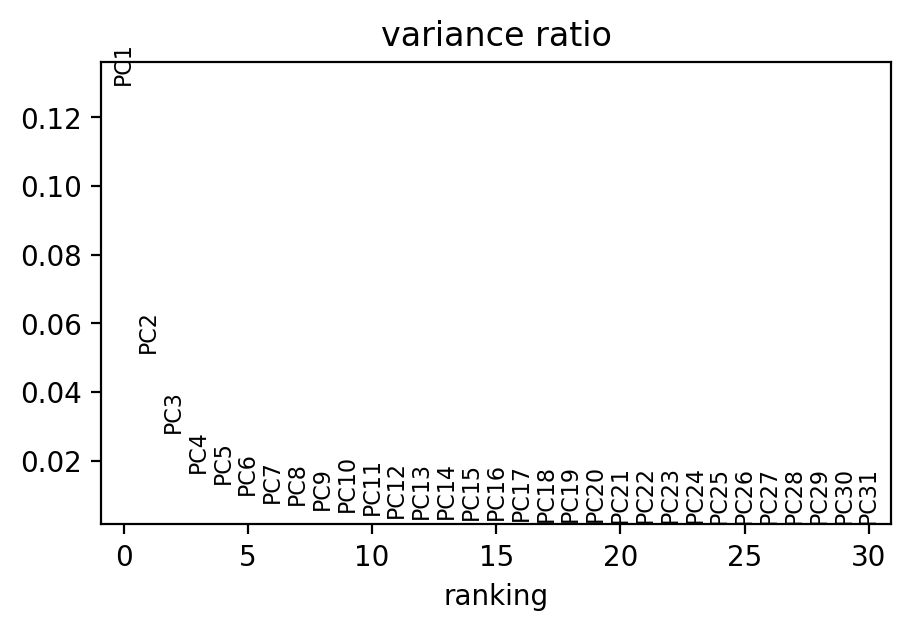

AnnData object with n_obs × n_vars = 8541 × 22247
    obs: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts'
    var: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'log_norm'

In [9]:
sc.pp.pca(
    adata,
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 3
sc.pl.pca_variance_ratio(
    adata
)

adata

/tmp/ipykernel_2179698/2926489958.py:10: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(


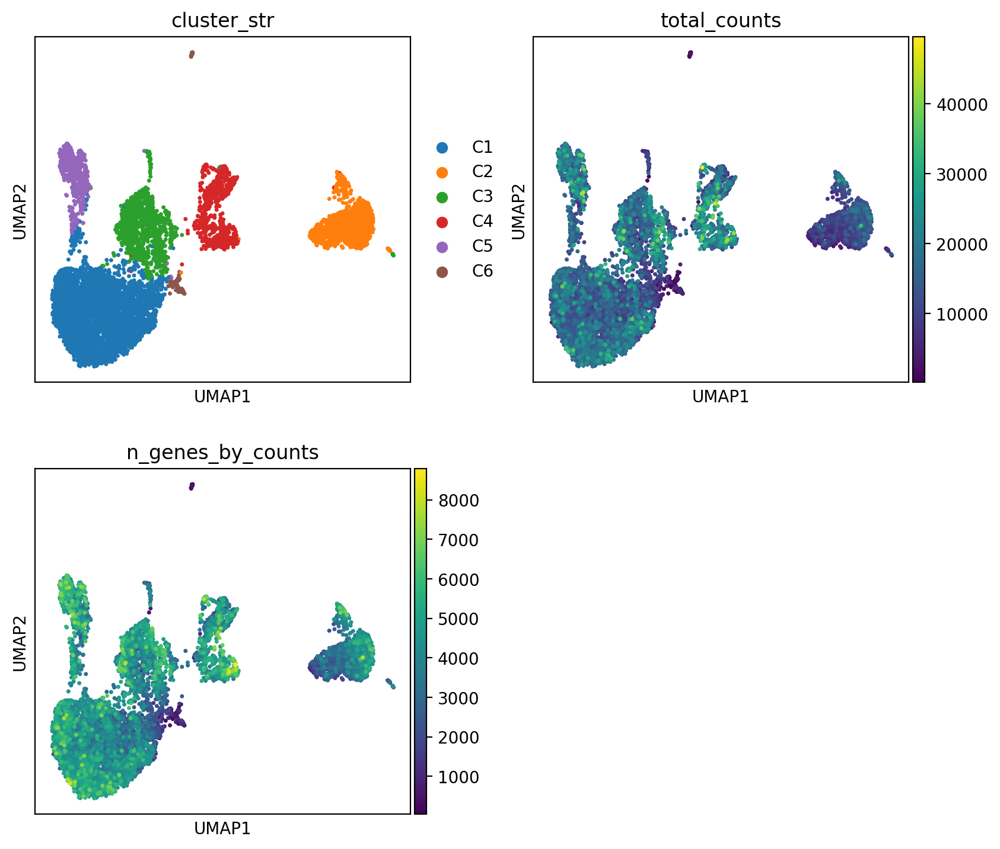

In [10]:
sc.pp.neighbors(
    adata,
)

sc.tl.umap(
    adata,
    min_dist=0.15,
)

sc.tl.leiden(
    adata,
    resolution=0.18,
)

adata.obs['cluster_str'] = adata.obs['leiden'].apply(lambda x: f"C{str(int(x) + 1)}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=['cluster_str', 'total_counts',
           'n_genes_by_counts', ],
    size=25,
    ncols=2,
)

4 kept
['GATA2', 'STAT5A', 'REL', 'FOS']


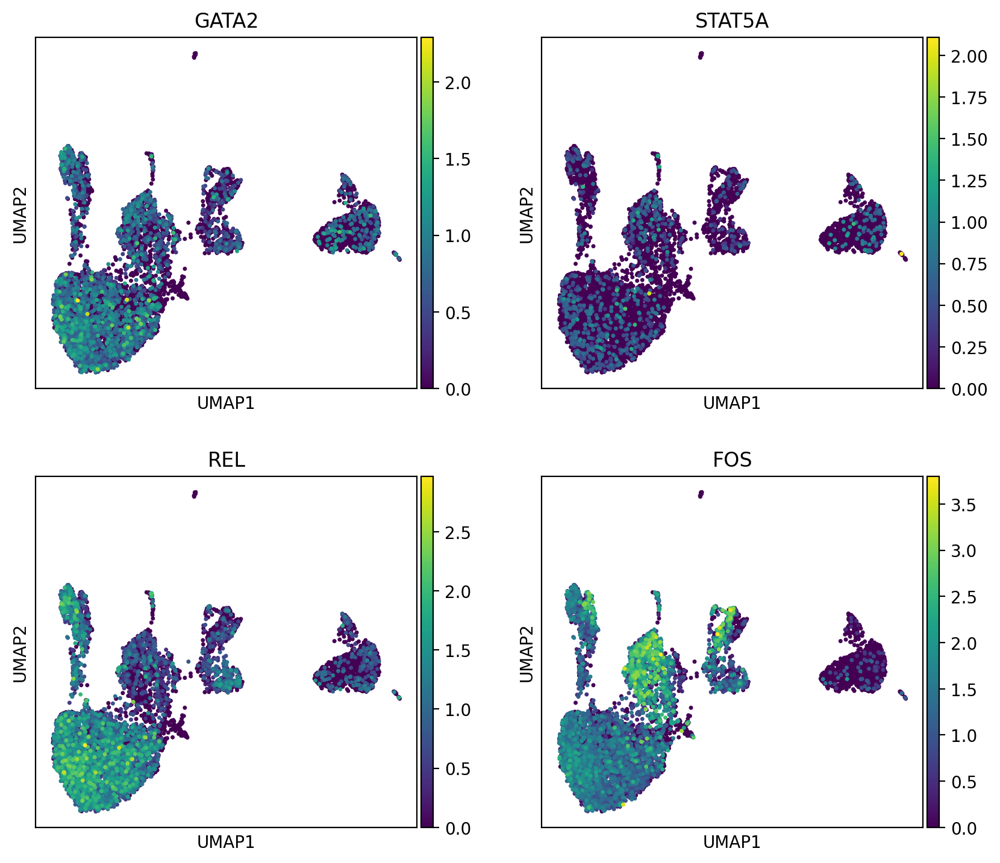

In [11]:
hsc_genes = [
     "GATA2", "STAT5A", "REL", "FOS",
]

hsc_genes = [x for x in hsc_genes if x in adata.var_names]
print(f"{len(hsc_genes)} kept")
print(hsc_genes)

sc.pl.umap(
    adata,
    color=hsc_genes,
    size=25,
    ncols=2,
)


35 kept
['RUNX1', 'GATA2', 'LMO2', 'HOXA9', 'MEIS1', 'ERG', 'CD34', 'BMI1', 'HES1', 'NR4A1', 'FOXO3', 'MPL', 'TEK', 'THY1', 'TP53', 'ATM', 'BRCA1', 'CHEK2', 'CDKN1A', 'CDKN2A', 'E2F2', 'ANGPT1', 'KITLG', 'JAK2', 'NOTCH1', 'JAG1', 'WNT3A', 'FZD7', 'DNMT3A', 'TET2', 'ASXL1', 'EZH2', 'BCOR', 'IDH1', 'IDH2']


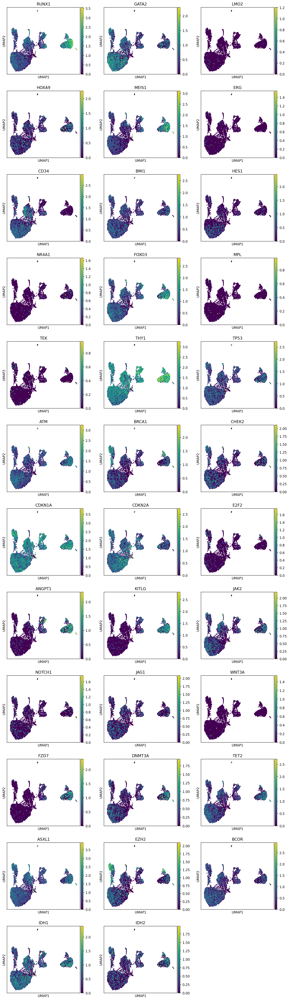

In [12]:
hsc_genes = [
    # Transcription factors
    "RUNX1", "GATA2", "TAL1", "LMO2", "HOXA9", "MEIS1", "MYB", "ERG",
    
    # Surface markers
    "CD34", "CD38", "CD90", "CD45RA", "CD49f", "CD133", "CD117", "CD105", "CD150", "CD48",
    
    # Stemness and quiescence
    "BMI1", "HES1", "NR4A1", "FOXO3", "MPL", "TEK", "THY1",
    
    # Cell cycle and DNA repair
    "TP53", "ATM", "BRCA1", "CHEK2", "CDKN1A", "CDKN2A", "E2F2",
    
    # Niche interaction and signaling
    "CXCR4", "ANGPT1", "KITLG", "TPO", "SCF", "JAK2", "NOTCH1", "DLL4", "JAG1", "WNT3A", "FZD7",
    
    # Epigenetic regulators
    "DNMT3A", "TET2", "ASXL1", "EZH2", "MLL1", "BCOR", "IDH1", "IDH2"
]

hsc_genes = [x for x in hsc_genes if x in adata.var_names]
print(f"{len(hsc_genes)} kept")
print(hsc_genes)

sc.pl.umap(
    adata,
    color=hsc_genes,
    size=25,
    ncols=3,
)


25 kept
['PECAM1', 'VWF', 'MCAM', 'ENG', 'ICAM1', 'CD34', 'ERG', 'FOXC2', 'GATA2', 'ETV2', 'NRP1', 'FLT1', 'TIE1', 'TEK', 'ANGPT1', 'ANGPT2', 'VEGFA', 'VEGFC', 'JAG1', 'NOTCH4', 'OCLN', 'TJP1', 'EDN1', 'THBD', 'PDGFB']


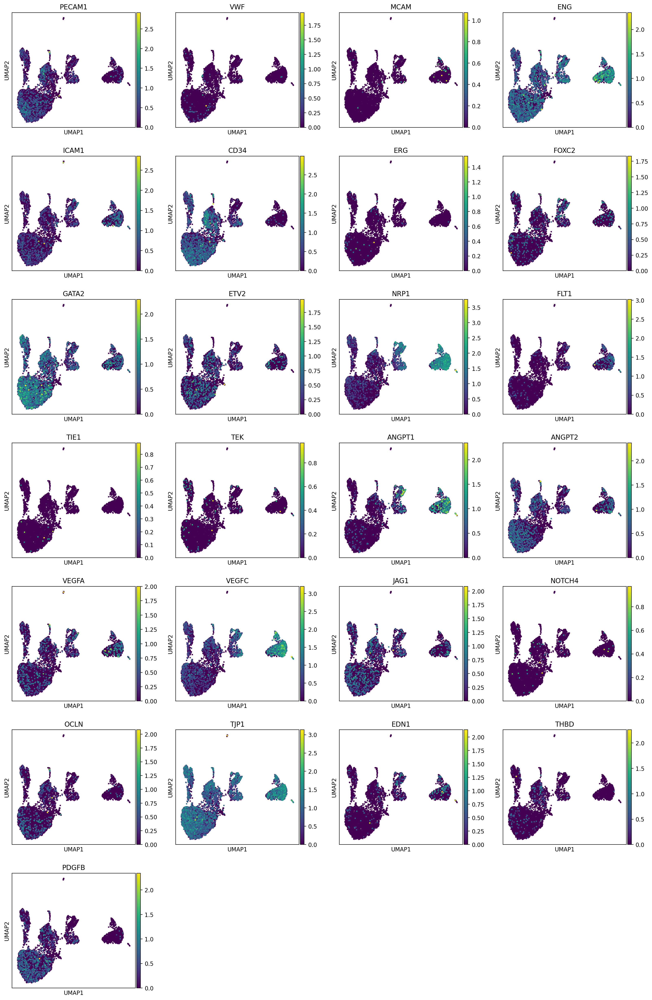

In [13]:
endothelial_genes = [
    # Surface markers
    "PECAM1", "CDH5", "VWF", "MCAM", "ESAM", "ENG", "ICAM1", "VCAM1", "CD34",

    # Transcription factors
    "ERG", "FOXC2", "GATA2", "SOX17", "ETV2", "NRP1",

    # Signaling and angiogenesis
    "KDR", "FLT1", "TIE1", "TEK", "ANGPT1", "ANGPT2", "VEGFA", "VEGFC", "DLL4", "JAG1", "NOTCH4",

    # Junction proteins
    "CLDN5", "OCLN", "TJP1", "CDH5",

    # Extracellular matrix and response to flow
    "NOS3", "EDN1", "THBD", "SELE", "PDGFB"
]

endothelial_genes = [x for x in endothelial_genes if x in adata.var_names]
print(f"{len(endothelial_genes)} kept")
print(endothelial_genes)

sc.pl.umap(
    adata,
    color=endothelial_genes,
    size=25,
    ncols=4,
)


27 kept
['PDGFRA', 'PDGFRB', 'THY1', 'S100A4', 'CD44', 'VIM', 'TWIST1', 'ZEB1', 'FOXC1', 'GLI1', 'COL1A1', 'COL1A2', 'COL3A1', 'FN1', 'LOX', 'MMP2', 'TIMP1', 'TIMP2', 'ACTA2', 'TAGLN', 'MYH11', 'CNN1', 'TGFB1', 'TGFBR1', 'SMAD2', 'SMAD3', 'POSTN']


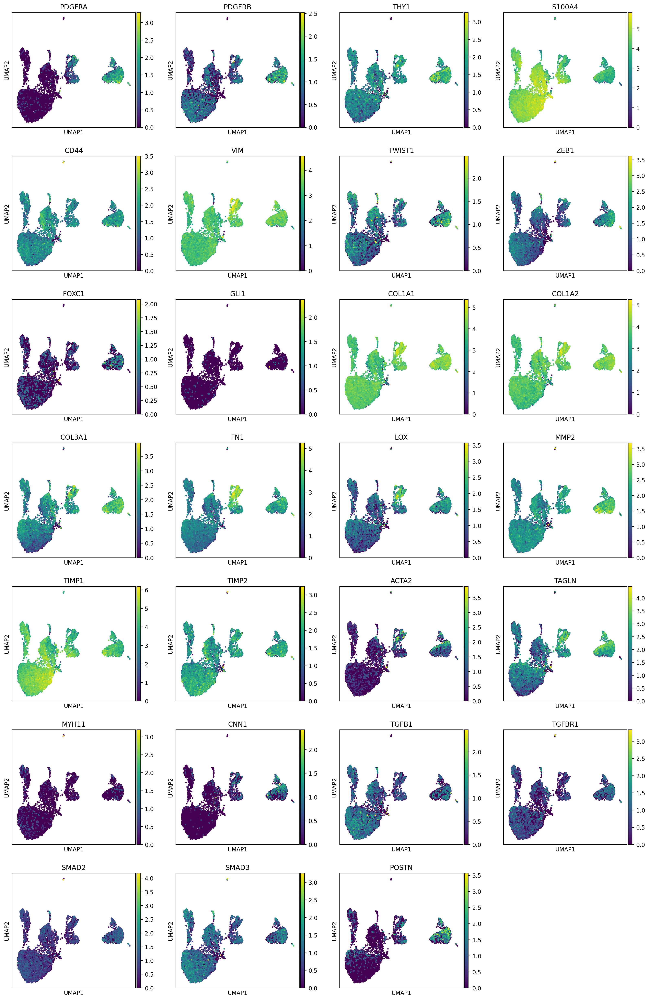

In [14]:
fibroblast_genes = [
    # Surface markers
    "PDGFRA", "PDGFRB", "THY1", "CD90", "FSP1", "S100A4", "CD44", "VIM",

    # Transcription factors
    "TWIST1", "ZEB1", "TCF21", "FOXC1", "GLI1",

    # ECM production and remodeling
    "COL1A1", "COL1A2", "COL3A1", "FN1", "LOX", "MMP2", "MMP9", "TIMP1", "TIMP2",

    # Cytoskeletal and contractile proteins
    "ACTA2", "TAGLN", "MYH11", "CNN1",

    # Fibrosis and TGF-β signaling
    "TGFB1", "TGFBR1", "SMAD2", "SMAD3", "CTGF", "POSTN"
]

fibroblast_genes = [x for x in fibroblast_genes if x in adata.var_names]
print(f"{len(fibroblast_genes)} kept")
print(fibroblast_genes)

sc.pl.umap(
    adata,
    color=fibroblast_genes,
    size=25,
    ncols=4,
)


In [15]:
# break

# Imputation

In [16]:
sce.pp.magic(adata, solver='approximate')
adata.layers['magic'] = adata.X.copy()
adata.X = adata.layers['log_norm'].copy()
adata

AnnData object with n_obs × n_vars = 8541 × 22247
    obs: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'leiden', 'cluster_str'
    var: 'hac_v3', 'fast_v4.2', 'fast_v3', 'minion_384', 'hac_v4.3', 'hac_v4.2', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'cluster_str_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 

4 kept
['RUNX1', 'GATA2', 'MEIS1', 'CD34']


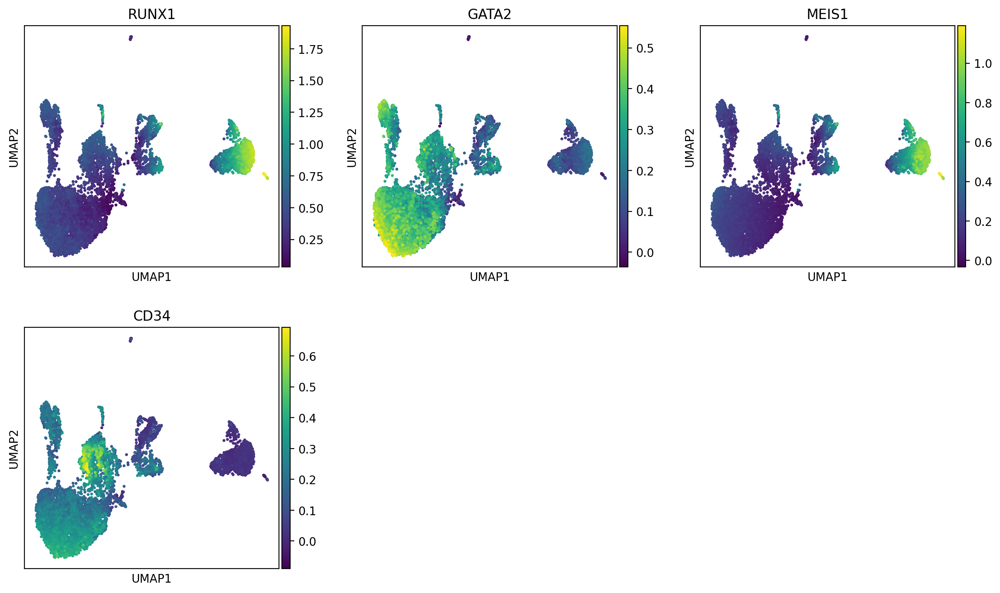

In [17]:
hsc_genes = [
    "RUNX1", "GATA2", "MEIS1", "CD34", 
]

hsc_genes = [x for x in hsc_genes if x in adata.var_names]
print(f"{len(hsc_genes)} kept")
print(hsc_genes)

sc.pl.umap(
    adata,
    color=hsc_genes,
    size=25,
    ncols=3,
    layer='magic'
)


# Differential Expression

In [18]:
sc.tl.rank_genes_groups(
    adata, 
    groupby="cluster_str",
    method='wilcoxon',
    corr_method='benjamini-hochberg',
    pts=True,
)

deg = sc.get.rank_genes_groups_df(
    adata, 
    group=None,
)

deg.head()

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,C1,MORC3,58.362766,3.173441,0.0,0.0,0.945959,0.529117
1,C1,KRT18,55.873417,2.499877,0.0,0.0,0.999035,0.700182
2,C1,S100A6,50.735645,0.989232,0.0,0.0,1.000000,0.999090
3,C1,MT1E,49.978374,1.671720,0.0,0.0,0.995657,0.878753
4,C1,TPST2,47.950035,1.839299,0.0,0.0,0.939204,0.566424


In [19]:
def filter_deg(deg, alpha=0.01, lfc=1):
    print(f" - Starting DEG filtering with alpha={alpha}, log2FC>{lfc}")
    sig = deg.copy()
    
    initial_count = len(sig)
    print(f" - Total genes before filtering: {initial_count}")
    
    sig = sig[sig['pvals_adj'] <= alpha]
    after_pval_filter = len(sig)
    print(f" - Genes with adjusted p-value <= {alpha}: {after_pval_filter}")
    
    sig = sig[sig['logfoldchanges'] > lfc].reset_index(drop=True)
    after_lfc_filter = len(sig)
    print(f" - Genes with log2 fold change > {lfc}: {after_lfc_filter}")
    
    sig = sig.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False])
    print(f" - Final gene count after filtering: {len(sig)}")
    return sig
    
sig = filter_deg(deg)
sig.head()

 - Starting DEG filtering with alpha=0.01, log2FC>1
 - Total genes before filtering: 133482
 - Genes with adjusted p-value <= 0.01: 28846
 - Genes with log2 fold change > 1: 2654
 - Final gene count after filtering: 2654


,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,C1,MORC3,58.362766,3.173441,0.000000e+00,0.000000e+00,0.945959,0.529117
125,C1,RGS16,15.059197,2.556882,3.004107e-51,1.123233e-49,0.239807,0.056415
1,C1,KRT18,55.873417,2.499877,0.000000e+00,0.000000e+00,0.999035,0.700182
24,C1,MGP,38.151173,2.332227,0.000000e+00,0.000000e+00,0.998794,0.715651
91,C1,RPS6KA6,20.963911,2.221647,1.400916e-97,1.056481e-95,0.353679,0.102366


In [39]:
n_genes = 50
database = 'celltypes'

print(f"Running Enrichment on {n_genes} genes using database: {database}")

logging.getLogger().setLevel(logging.ERROR)

for group_id, group_df in sig.groupby('group'):
    gene_list = group_df['names'].head(n_genes).to_list()
    edf = gget.enrichr(
        gene_list,
        database=database,
    )

    edf = edf[['path_name', 'adj_p_val', 'overlapping_genes']]
    print(f"\n----- cluster {group_id}  -----")
    print(edf.head().to_string(index=False))
    time.sleep(2)

Running Enrichment on 50 genes using database: celltypes

----- cluster C1  -----
        path_name  adj_p_val            overlapping_genes
Endothelial Cells   0.065883 [PODXL, MGP, PDGFB, S100A10]
    Keratinocytes   0.065883            [REL, PKP1, AQP3]
 Gamma (PP) Cells   0.065883        [UNC5C, AQP3, LONRF2]
Trophoblast Cells   0.065883    [SERPINE1, IL18, S100A10]
     Ductal Cells   0.065883     [KRT18, AKR1C3, S100A10]

----- cluster C2  -----
             path_name    adj_p_val                                      overlapping_genes
       Meningeal Cells 3.238034e-08 [IGFBP5, LUM, LAMA4, PTN, PDZRN3, MXRA5, DCN, RUNX1T1]
         Stromal Cells 9.387841e-07               [MME, LUM, MMP1, LAMA4, TNC, MXRA5, DCN]
Hepatic Stellate Cells 9.651669e-07       [IGFBP5, LUM, IGFBP3, LAMA4, PDZRN3, MXRA5, DCN]
          Chondrocytes 1.216038e-06          [IGFBP5, LUM, LAMA4, TNC, PDZRN3, MXRA5, DCN]
          M?ller Cells 1.216038e-06       [IL6, IGFBP5, PLPPR4, PTN, PDZRN3, MXRA5, KCNJ2]

In [40]:
n_genes = 50
database = 'ontology'

print(f"Running Enrichment on {n_genes} genes using database: {database}")


for group_id, group_df in sig.groupby('group'):
    gene_list = group_df['names'].head(n_genes).to_list()
    edf = gget.enrichr(
        gene_list,
        database=database,
    )

    edf = edf[['path_name', 'adj_p_val', 'overlapping_genes']]
    print(f"\n----- cluster {group_id}  -----")
    print(edf.head().to_string(index=False))
    time.sleep(2)

Running Enrichment on 50 genes using database: ontology

----- cluster C1  -----
                                                        path_name  adj_p_val                   overlapping_genes
          regulation of smooth muscle cell migration (GO:0014910)   0.007917             [SERPINE1, PDGFB, CCN4]
positive regulation of response to external stimulus (GO:0032103)   0.007917 [SERPINE1, IL18, PDGFB, CCN4, GPR4]
        positive regulation of inflammatory response (GO:0050729)   0.013547        [SERPINE1, IL18, CCN4, GPR4]
             positive regulation of defense response (GO:0031349)   0.013547        [SERPINE1, IL18, CCN4, GPR4]
           interleukin-18-mediated signaling pathway (GO:0035655)   0.013547                       [IL18, PDGFB]

----- cluster C2  -----
                                                           path_name  adj_p_val                         overlapping_genes
         regulation of smooth muscle cell proliferation (GO:0048660)   0.000115        [IL6, I

In [20]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)